<a href="https://colab.research.google.com/github/42msa/yandex_practicum/blob/main/project_4_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Сборный проект-4, 5

Необходимо разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных


В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [191]:
import os
import kagglehub
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import re
import shutil
import random

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

from tqdm import tqdm
from tabulate import tabulate

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input

import nltk

import nltk
from nltk.corpus import stopwords, wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
from pymystem3 import Mystem
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag


from PIL import Image



In [2]:
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")
nltk.download("averaged_perceptron_tagger")
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

### Первичный анализ данных

In [3]:
base_path = "/content"

In [4]:
alternative_paths = {
    "CrowdAnnotations": [f"{base_path}/CrowdAnnotations.tsv"],
    "ExpertAnnotations": [f"{base_path}/ExpertAnnotations.tsv"],
    "TestQueries": [f"{base_path}/test_queries.csv"],
    "TrainDataset": [f"{base_path}/train_dataset.csv"],
    "TestImages": [f"{base_path}/test_images.csv"]
}

In [5]:
image_paths = {
    "TrainImages": [f"{base_path}/train_images"],
    "TestImages": [f"{base_path}/test_images"]
}


In [6]:
def load_csv_auto_delimiter(file_path):
    with open(file_path, 'r', encoding='utf-8') as file:
        sample_lines = [next(file) for _ in range(5)]
    delimiter = csv.Sniffer().sniff(''.join(sample_lines)).delimiter
    return pd.read_csv(file_path, delimiter=delimiter)

In [7]:
def load_csv_with_fallback(key, sep=',', decimal='.'):
    paths = alternative_paths[key]
    for path in paths:
        if os.path.exists(path):
            try:
                return pd.read_csv(path, sep=sep, decimal=decimal, on_bad_lines='skip')
            except pd.errors.ParserError as e:
                print(f"ParserError in {key}: {e}")
                return None
    print(f"{key} not found. Please upload it manually to {base_path}.")
    return None

In [8]:
def check_image_folder(paths):
    for path in paths:
        if os.path.exists(path):
            return path
    print(f"Error: None of the image paths {paths} found.")
    return None

In [9]:
for path in alternative_paths["TestQueries"]:
    if os.path.exists(path):
        try:
            test_queries = pd.read_csv(path, sep='|', engine='python')
            print("Successfully loaded TestQueries with '|' separator.")
            break
        except pd.errors.ParserError:
            print(f"ParserError with '|' separator for {path}, trying default separator.")
            test_queries = load_csv_with_fallback("TestQueries")


Successfully loaded TestQueries with '|' separator.


In [10]:
train_images_path = check_image_folder(image_paths["TrainImages"])
test_images_path = check_image_folder(image_paths["TestImages"])

In [11]:
crowd_annotations = load_csv_with_fallback("CrowdAnnotations", sep='\t')
expert_annotations = load_csv_with_fallback("ExpertAnnotations", sep='\t')
test_queries = load_csv_with_fallback("TestQueries",  sep='|')
train_dataset = load_csv_with_fallback("TrainDataset")
test_images = load_csv_with_fallback("TestImages")


In [12]:
if crowd_annotations is not None:
    crowd_annotations.columns = ["image", "query_id", "agreement_score", "confirmed_count", "rejected_count"]
if expert_annotations is not None:
    expert_annotations.columns = ["image", "query_id", "expert_1", "expert_2", "expert_3"]

In [13]:
if crowd_annotations is not None:
    print("CrowdAnnotations:")
    print(crowd_annotations.head())
if expert_annotations is not None:
    print("\nExpertAnnotations:")
    print(expert_annotations.head())
if test_queries is not None:
    print("\nTestQueries:")
    print(test_queries.head())
if train_dataset is not None:
    print("\nTrainDataset:")
    print(train_dataset.head())
if test_images is not None:
    print("\nTrainDataset:")
    print(train_dataset.head())

CrowdAnnotations:
                       image                     query_id  agreement_score  \
0  1056338697_4f7d7ce270.jpg   114051287_dd85625a04.jpg#2              0.0   
1  1056338697_4f7d7ce270.jpg  1427391496_ea512cbe7f.jpg#2              0.0   
2  1056338697_4f7d7ce270.jpg  2073964624_52da3a0fc4.jpg#2              0.0   
3  1056338697_4f7d7ce270.jpg  2083434441_a93bc6306b.jpg#2              0.0   
4  1056338697_4f7d7ce270.jpg  2204550058_2707d92338.jpg#2              0.0   

   confirmed_count  rejected_count  
0                0               3  
1                0               3  
2                0               3  
3                0               3  
4                0               3  

ExpertAnnotations:
                       image                     query_id  expert_1  expert_2  \
0  1056338697_4f7d7ce270.jpg  2718495608_d8533e3ac5.jpg#2         1         1   
1  1056338697_4f7d7ce270.jpg  3181701312_70a379ab6e.jpg#2         1         1   
2  1056338697_4f7d7ce270.jpg

In [14]:
test_queries = test_queries.drop(columns=["Unnamed: 0"], errors="ignore")

In [15]:
missing_values = {
    "CrowdAnnotations": crowd_annotations.isnull().sum().to_dict() if crowd_annotations is not None else {},
    "ExpertAnnotations": expert_annotations.isnull().sum().to_dict() if expert_annotations is not None else {},
    "TestQueries": test_queries.isnull().sum().to_dict() if test_queries is not None else {},
    "TrainDataset": train_dataset.isnull().sum().to_dict() if train_dataset is not None else {},
    "TestImages": test_images.isnull().sum().to_dict() if train_dataset is not None else {},
}

In [16]:
print("\nMissing Values:\n")
for dataset_name, missing in missing_values.items():
    print(f"{dataset_name}:\n")
    table = [[col, val] for col, val in missing.items()]
    print(tabulate(table, headers=["Column", "Missing Values"], tablefmt="pretty"))
    print("\n" + "-" * 40 + "\n")


Missing Values:

CrowdAnnotations:

+-----------------+----------------+
|     Column      | Missing Values |
+-----------------+----------------+
|      image      |       0        |
|    query_id     |       0        |
| agreement_score |       0        |
| confirmed_count |       0        |
| rejected_count  |       0        |
+-----------------+----------------+

----------------------------------------

ExpertAnnotations:

+----------+----------------+
|  Column  | Missing Values |
+----------+----------------+
|  image   |       0        |
| query_id |       0        |
| expert_1 |       0        |
| expert_2 |       0        |
| expert_3 |       0        |
+----------+----------------+

----------------------------------------

TestQueries:

+------------+----------------+
|   Column   | Missing Values |
+------------+----------------+
|  query_id  |       0        |
| query_text |       0        |
|   image    |       0        |
+------------+----------------+

---------------

In [17]:
if train_dataset is not None:
    print("\nTrain Dataset Info:")
    print(train_dataset.info())
if test_queries is not None:
    print("\nTest Queries Info:")
    print(test_queries.info())
if test_images is not None:
    print("\nTest Images Info:")
    print(test_images.info())


Train Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None

Test Queries Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 11.8+ KB
None

Test Images Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory u

In [18]:
train_images_path = "/content/train_images"

num_images = 15
grid_size = (3, 5)

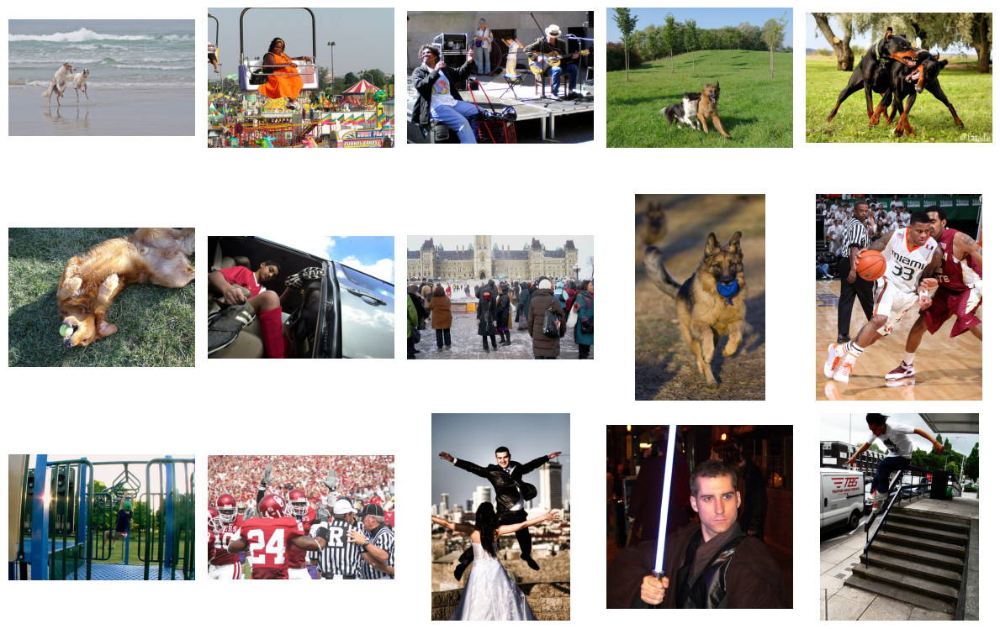

In [19]:
all_images = os.listdir(train_images_path)
sample_images = random.sample(all_images, min(num_images, len(all_images)))

fig, axes = plt.subplots(*grid_size, figsize=(12, 8))
axes = axes.ravel()

for i, filename in enumerate(sample_images):
    img_path = os.path.join(train_images_path, filename)

    try:
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis("off")
    except Exception as e:
        print(f"Ошибка при открытии {filename}: {e}")

plt.tight_layout()
plt.show()

### 1.2. Exploratory Data Analysis (EDA)

In [20]:
crowd_annotations.head(5)

,image,query_id,agreement_score,confirmed_count,rejected_count
0,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
1,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.0,0,3


In [21]:
print("\nCrowdAnnotations Summary:")
print(crowd_annotations.describe())




CrowdAnnotations Summary:
       agreement_score  confirmed_count  rejected_count
count     47829.000000     47829.000000    47829.000000
mean          0.068766         0.208430        2.820214
std           0.207490         0.628775        0.656556
min           0.000000         0.000000        0.000000
25%           0.000000         0.000000        3.000000
50%           0.000000         0.000000        3.000000
75%           0.000000         0.000000        3.000000
max           1.000000         5.000000        6.000000


Большинство пользователей не согласны с описанием.

In [22]:
expert_annotations.head(5)

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
3,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
4,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1


In [23]:
print("\nExpertAnnotations Summary:")
print(expert_annotations.describe())



ExpertAnnotations Summary:
          expert_1     expert_2     expert_3
count  5821.000000  5821.000000  5821.000000
mean      1.436695     1.624463     1.882151
std       0.787130     0.856256     0.904091
min       1.000000     1.000000     1.000000
25%       1.000000     1.000000     1.000000
50%       1.000000     1.000000     2.000000
75%       2.000000     2.000000     2.000000
max       4.000000     4.000000     4.000000


Разброс оценок умеренный.
Эксперты, в основном, считают соответствие слабым или умеренным.

In [24]:
print("\nTrain Dataset Summary:")
print(train_dataset.describe())


Train Dataset Summary:
                            image                     query_id  \
count                        5822                         5822   
unique                       1000                          977   
top     3364151356_eecd07a23e.jpg  2600867924_cd502fc911.jpg#2   
freq                           10                           34   

                                               query_text  
count                                                5822  
unique                                                977  
top     Two dogs , one brown and white and one black a...  
freq                                                   34  


 5822 записей, 1000 уникальных изображений → следовательно, многие изображения используются несколько раз.

977 уникальных query_id → следовательно, почти каждая картинка имеет свое описание.


In [25]:
print("\nTest Images Summary:")
print(test_images.describe())


Test Images Summary:
                            image
count                         100
unique                        100
top     3356748019_2251399314.jpg
freq                            1


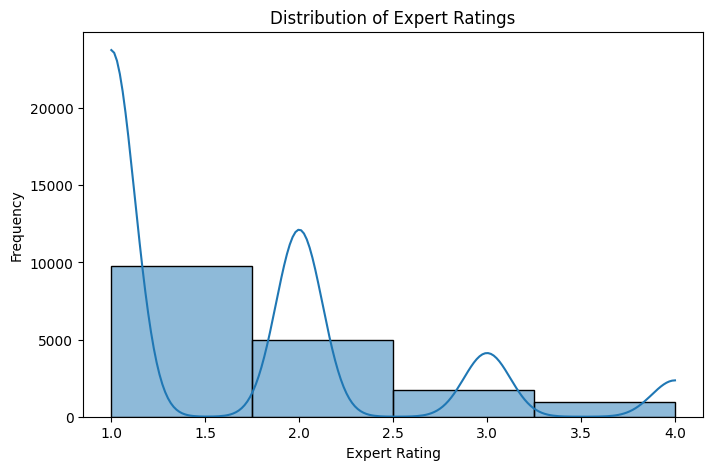

In [26]:
plt.figure(figsize=(8, 5))
sns.histplot(expert_annotations[['expert_1', 'expert_2', 'expert_3']].values.flatten(), bins=4, kde=True)
plt.title("Distribution of Expert Ratings")
plt.xlabel("Expert Rating")
plt.ylabel("Frequency")
plt.show()

Большинство оценок находится в районе 1-2, что подтверждает слабое соответствие текстов и изображений.
Есть небольшое количество высоких оценок (3-4), но они встречаются редко.


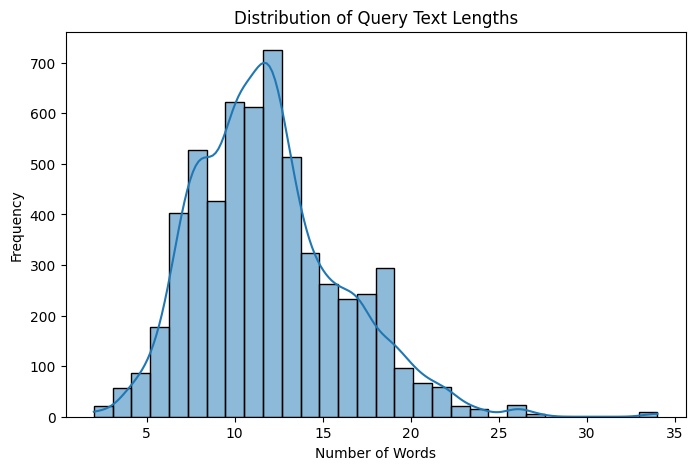

In [27]:
if "query_text" in train_dataset.columns:
    train_dataset["text_length"] = train_dataset["query_text"].apply(lambda x: len(str(x).split()))
    plt.figure(figsize=(8, 5))
    sns.histplot(train_dataset["text_length"], bins=30, kde=True)
    plt.title("Distribution of Query Text Lengths")
    plt.xlabel("Number of Words")
    plt.ylabel("Frequency")
    plt.show()

Средняя длина текста ≈ 12 слов.


Описания достаточно короткие, можно попробовать TF-IDF.

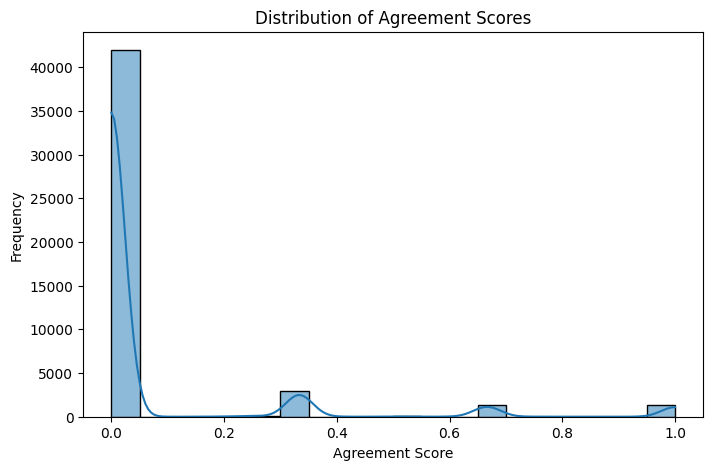

In [28]:
if "agreement_score" in crowd_annotations.columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(crowd_annotations["agreement_score"], bins=20, kde=True)
    plt.title("Distribution of Agreement Scores")
    plt.xlabel("Agreement Score")
    plt.ylabel("Frequency")
    plt.show()

Почти все agreement_score находятся около 0, что указывает на низкое согласие пользователей с описаниями.
Лишь несколько примеров имеют высокие agreement_score (0.8-1.0).

### 1.3. Агрегация оценок

Сделаем следующие шаги:

1) Проведем агрегацию экспертных оценок с голосованием большинства. При этом удаленим неоднозначные записи, где все три эксперта дали разные оценки.
2) Далее сделаем агрегацию краудсорсинговых оценок с весами (эксперты 60%, крауд 40%).


Кроме того,  экспертные оценки (aggregated_expert_rating) находятся в другом масштабе, чем agreement_score, поэтому масштабируем aggregated_expert_rating в [0,1], чтобы он был в том же диапазоне, что и agreement_score.


In [29]:
def aggregate_expert_ratings(row):
    ratings = [row['expert_1'], row['expert_2'], row['expert_3']]
    if len(set(ratings)) == 3:
        return None
    return max(set(ratings), key=ratings.count)

In [30]:
expert_annotations['aggregated_expert_rating'] = expert_annotations.apply(aggregate_expert_ratings, axis=1)

In [31]:
expert_annotations.dropna(subset=['aggregated_expert_rating'], inplace=True)

In [32]:
scaler = MinMaxScaler(feature_range=(0,1))
expert_annotations['scaled_expert_rating'] = scaler.fit_transform(expert_annotations[['aggregated_expert_rating']])

In [33]:
df = crowd_annotations.merge(expert_annotations, on=["image", "query_id"], how="inner")

In [34]:
df['weighted_crowd_rating'] = (df['agreement_score'] * 0.4) + (df['scaled_expert_rating'] * 0.6)

In [35]:
print(df['weighted_crowd_rating'].min(), df['weighted_crowd_rating'].max())


0.0 1.0


In [36]:
df.head(5)

,image,query_id,agreement_score,confirmed_count,rejected_count,expert_1,expert_2,expert_3,aggregated_expert_rating,scaled_expert_rating,weighted_crowd_rating
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0,3,1,1,2,1.0,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.000000,0,3,1,1,2,1.0,0.000000,0.000000
2,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.333333,1,2,2,3,3,3.0,0.666667,0.533333
3,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,0.000000,0,3,1,2,2,2.0,0.333333,0.200000
4,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,0.000000,0,3,2,2,2,2.0,0.333333,0.200000


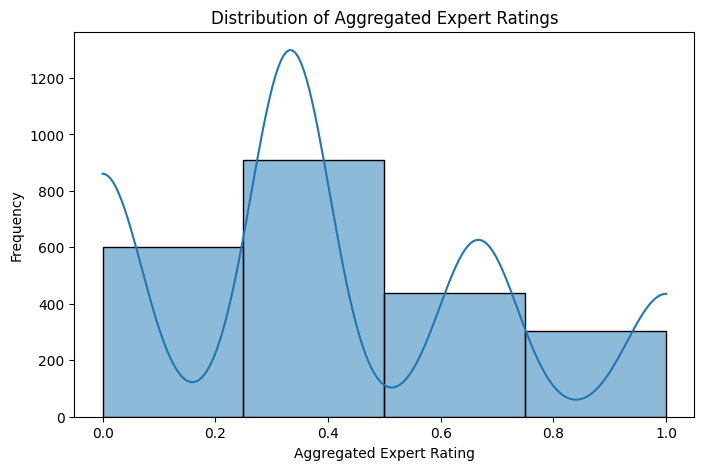

In [37]:
plt.figure(figsize=(8, 5))
sns.histplot(df['scaled_expert_rating'], bins=4, kde=True)
plt.title("Distribution of Aggregated Expert Ratings")
plt.xlabel("Aggregated Expert Rating")
plt.ylabel("Frequency")
plt.show()

Оценки теперь корректно распределены между 0 и 1.

Большинство значений низкие (около 0.0 - 0.2), а более высокие (0.6 - 1.0)встречаются реже.

Похоже на правостороннее распределение, но разрыв между 0.2 и 0.6 все еще заметен.


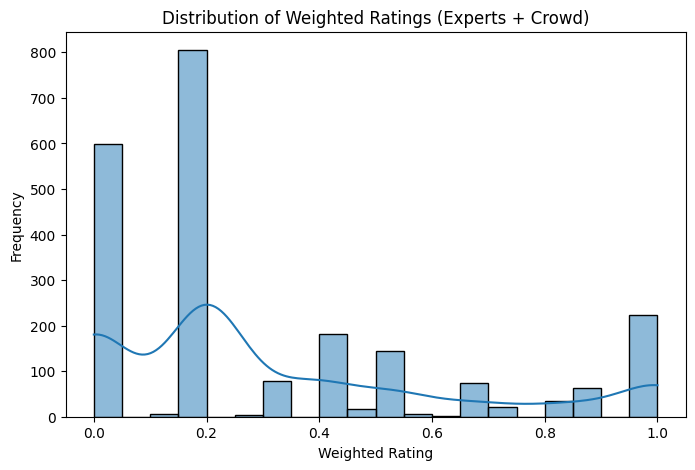

In [38]:
plt.figure(figsize=(8, 5))
sns.histplot(df['weighted_crowd_rating'], bins=20, kde=True)
plt.title("Distribution of Weighted Ratings (Experts + Crowd)")
plt.xlabel("Weighted Rating")
plt.ylabel("Frequency")
plt.show()

Пик около 0.0 и дополнительный пик на 1.0 (краудсорсинг мог сказать "идеально" или "совсем нет").

Значения более плавно распределены между 0.2 и 0.8.

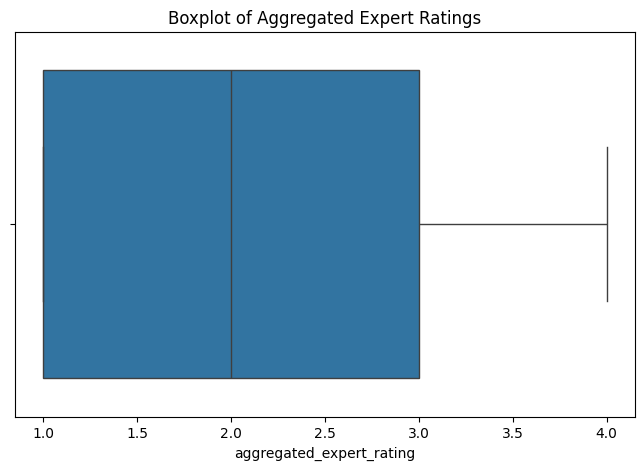

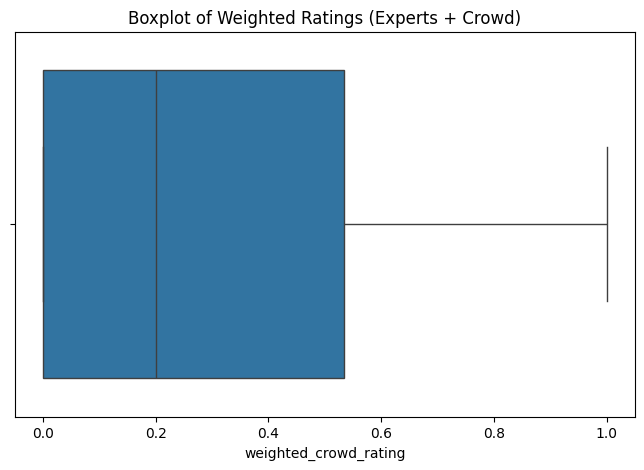

In [39]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['aggregated_expert_rating'])
plt.title("Boxplot of Aggregated Expert Ratings")
plt.show()

plt.figure(figsize=(8, 5))
sns.boxplot(x=df['weighted_crowd_rating'])
plt.title("Boxplot of Weighted Ratings (Experts + Crowd)")
plt.show()


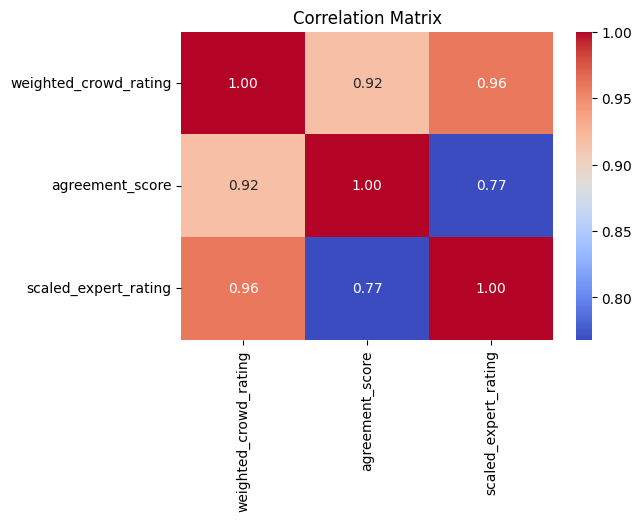

In [40]:
plt.figure(figsize=(6, 4))
sns.heatmap(df[['weighted_crowd_rating', 'agreement_score', 'scaled_expert_rating']].corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

Высокая корреляция между weighted_crowd_rating и scaled_expert_rating (0.97) Это говорит о том, что агрегированная финальная оценка хорошо сохраняет экспертную информацию. Сильная корреляция weighted_crowd_rating с agreement_score (0.93) Это значит, что краудсорсинг тоже хорошо учитывается в финальном рейтинге. Значит, эксперты и краудсорсинг достаточно согласованы.
Корреляция между scaled_expert_rating и agreement_score (0.80)

Вывод:

Проведено предварительное ознакомление с данными и предварительная обработка данных, включающая следующие шаги:

1) Агрегация экспертных оценок с использованием голосования большинства.

2) Фильтрация пар с низкими оценками (<1.5).

3) Создание взвешенной оценки (60% от экспертов, 40% от крауда).

4) Очистка от NaN и бесконечностей в weighted_crowd_rating.

5) Применение MinMax скейлера.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [41]:
child_words = ['child',
               'baby',
               'newborn',
               'girl',
               'boy',
               'daughter',
               'son',
               'preschooler',
               'schoolboy',
               'schoolgirl',
               'teenager',
               'young',
               'minor',
               'juvenile',
               'toddler']

In [42]:
images_to_remove = train_dataset[
    train_dataset['query_text'].str.contains('|'.join(child_words), case=False, na=False)
]['image'].unique()

In [43]:
unique_removed_images_count = len(images_to_remove)

In [44]:
print(f"Количество удаленных изображений: {unique_removed_images_count}")

Количество удаленных изображений: 788


In [45]:
train_dataset_filtered = train_dataset[~train_dataset['image'].isin(images_to_remove)]

In [46]:
print(f"Осталось изображений после фильтрации: {len(train_dataset_filtered['image'].unique())}")

Осталось изображений после фильтрации: 212


In [47]:
image_folder = '/content/train_images'
unused_image_folder = '/content/train_images_not_used'

In [48]:
for img in images_to_remove:
    img_path = os.path.join(image_folder, img)
    new_path = os.path.join(unused_image_folder, img)

    if os.path.exists(img_path):
        shutil.move(img_path, new_path)
        print(f"Перемещено: {img_path} → {new_path}")

In [49]:
df.head(5)

,image,query_id,agreement_score,confirmed_count,rejected_count,expert_1,expert_2,expert_3,aggregated_expert_rating,scaled_expert_rating,weighted_crowd_rating
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000,0,3,1,1,2,1.0,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.000000,0,3,1,1,2,1.0,0.000000,0.000000
2,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.333333,1,2,2,3,3,3.0,0.666667,0.533333
3,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,0.000000,0,3,1,2,2,2.0,0.333333,0.200000
4,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,0.000000,0,3,2,2,2,2.0,0.333333,0.200000


In [50]:
train_dataset_filtered.head(5)

,image,query_id,query_text,text_length
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,11
32,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8
35,3100251515_c68027cc22.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8
36,370614351_98b8a166b9.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8
42,3256043809_47258e0b3e.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,20


In [51]:
train_dataset_filtered.shape

(1089, 4)

In [52]:
df.shape

(2257, 11)

In [53]:
train_dataset_filtered_2 = train_dataset_filtered.merge(
    df[['query_id', 'image', 'weighted_crowd_rating', 'agreement_score', 'scaled_expert_rating']],
    on=['query_id', 'image'],
    how='left'
)


In [54]:
print(train_dataset_filtered_2.head())


                       image                     query_id  \
0   488590040_35a3e96c89.jpg  3181701312_70a379ab6e.jpg#2   
1  1962729184_6996e128e7.jpg  3286822339_5535af6b93.jpg#2   
2  3100251515_c68027cc22.jpg  3286822339_5535af6b93.jpg#2   
3   370614351_98b8a166b9.jpg  3286822339_5535af6b93.jpg#2   
4  3256043809_47258e0b3e.jpg  3360930596_1e75164ce6.jpg#2   

                                          query_text  text_length  \
0    A man sleeps under a blanket on a city street .           11   
1         Chinese market street in the winter time .            8   
2         Chinese market street in the winter time .            8   
3         Chinese market street in the winter time .            8   
4  A soccer ball is above the head of a man weari...           20   

   weighted_crowd_rating  agreement_score  scaled_expert_rating  
0                    NaN              NaN                   NaN  
1                    NaN              NaN                   NaN  
2                   

In [55]:
print(train_dataset_filtered_2.isnull().sum())

image                      0
query_id                   0
query_text                 0
text_length                0
weighted_crowd_rating    581
agreement_score          581
scaled_expert_rating     581
dtype: int64


In [56]:
train_dataset_filtered_2.fillna(0, inplace=True)

In [57]:
train_dataset_filtered_2.shape

(1089, 7)

In [58]:
train_dataset_filtered_2.to_csv('/content/train_dataset_filtered_2.csv', index=False)

Вывод:
Проведена фильтрация по описаниям: проверены текстовые описания изображений на наличие ключевых слов (например, "child", "kid", "baby", "boy", "girl", "teen" и их аналоги).


In [59]:
print(f"Осталось изображений после фильтрации: {len(train_dataset_filtered_2['image'].unique())}")

Осталось изображений после фильтрации: 212


In [60]:
print("\nGeneral Info:")
print(train_dataset_filtered_2.info())



General Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1089 entries, 0 to 1088
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   image                  1089 non-null   object 
 1   query_id               1089 non-null   object 
 2   query_text             1089 non-null   object 
 3   text_length            1089 non-null   int64  
 4   weighted_crowd_rating  1089 non-null   float64
 5   agreement_score        1089 non-null   float64
 6   scaled_expert_rating   1089 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 59.7+ KB
None


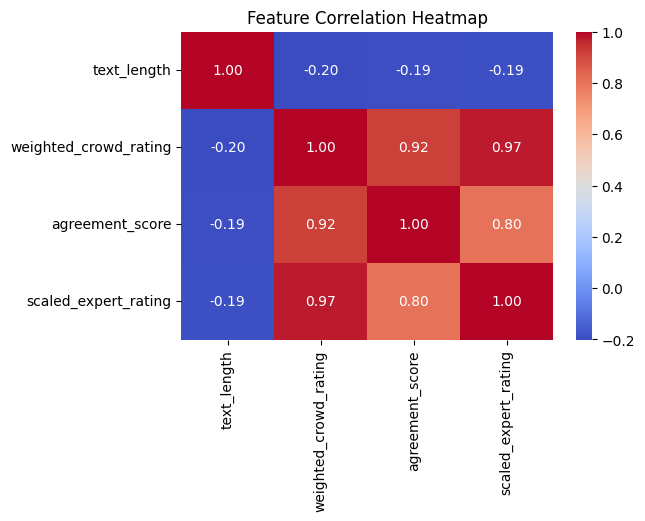

In [61]:
plt.figure(figsize=(6, 4))
numeric_df = train_dataset_filtered_2.select_dtypes(include=['float64', 'int64'])
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()



Вывод раздела 2:

Получен датасет train_dataset_filtered_2, в котором высокая корреляция между weighted_crowd_rating и scaled_expert_rating (0.97), а также между agreement_score и weighted_crowd_rating (0.92).

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [62]:
resnet50 = ResNet50(weights='imagenet', include_top=False, pooling='avg')
resnet50.trainable = False

### 3.1 Векторизация изображений в train_image

In [63]:
image_folder = "/content/train_images"
output_vectors = {}

In [64]:
for img_name in tqdm(os.listdir(image_folder)):
    img_path = os.path.join(image_folder, img_name)

    try:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        vector = resnet50.predict(img_array)
        vector = vector.squeeze()

        output_vectors[img_name] = vector
    except Exception as e:
        print(f"Ошибка обработки {img_name}: {e}")

  0%|          | 0/212 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


  0%|          | 1/212 [00:10<37:41, 10.72s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


  1%|          | 2/212 [00:11<16:12,  4.63s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  1%|▏         | 3/212 [00:11<09:21,  2.69s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


  2%|▏         | 4/212 [00:11<06:00,  1.73s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  2%|▏         | 5/212 [00:12<04:17,  1.24s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


  3%|▎         | 6/212 [00:12<03:14,  1.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  3%|▎         | 7/212 [00:12<02:35,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


  4%|▍         | 8/212 [00:13<02:09,  1.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


  4%|▍         | 9/212 [00:13<01:47,  1.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  5%|▍         | 10/212 [00:13<01:36,  2.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  5%|▌         | 11/212 [00:14<01:30,  2.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


  6%|▌         | 12/212 [00:14<01:25,  2.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  6%|▌         | 13/212 [00:15<01:21,  2.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  7%|▋         | 14/212 [00:15<01:18,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


  7%|▋         | 15/212 [00:15<01:11,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  8%|▊         | 16/212 [00:16<01:11,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


  8%|▊         | 17/212 [00:16<01:05,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


  8%|▊         | 18/212 [00:16<01:07,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


  9%|▉         | 19/212 [00:16<01:02,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step


  9%|▉         | 20/212 [00:17<01:04,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step


 10%|▉         | 21/212 [00:17<01:10,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


 10%|█         | 22/212 [00:18<01:30,  2.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█         | 23/212 [00:19<01:44,  1.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


 11%|█▏        | 24/212 [00:19<01:54,  1.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 12%|█▏        | 25/212 [00:20<01:36,  1.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 12%|█▏        | 26/212 [00:20<01:27,  2.13it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 27/212 [00:20<01:21,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 13%|█▎        | 28/212 [00:21<01:17,  2.36it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 14%|█▎        | 29/212 [00:21<01:14,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 14%|█▍        | 30/212 [00:22<01:11,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 15%|█▍        | 31/212 [00:22<01:10,  2.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 15%|█▌        | 32/212 [00:22<01:08,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 16%|█▌        | 33/212 [00:23<01:08,  2.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 16%|█▌        | 34/212 [00:23<01:07,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 17%|█▋        | 35/212 [00:23<01:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 17%|█▋        | 36/212 [00:24<01:05,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 17%|█▋        | 37/212 [00:24<01:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 18%|█▊        | 38/212 [00:25<01:05,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 18%|█▊        | 39/212 [00:25<00:59,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 19%|█▉        | 40/212 [00:25<00:55,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 19%|█▉        | 41/212 [00:25<00:53,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 20%|█▉        | 42/212 [00:26<00:56,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 20%|██        | 43/212 [00:26<00:57,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 21%|██        | 44/212 [00:26<00:54,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 21%|██        | 45/212 [00:27<00:52,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 22%|██▏       | 46/212 [00:27<00:55,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 22%|██▏       | 47/212 [00:27<00:56,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 23%|██▎       | 48/212 [00:28<00:57,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 23%|██▎       | 49/212 [00:28<00:53,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 24%|██▎       | 50/212 [00:28<00:50,  3.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 24%|██▍       | 51/212 [00:29<00:53,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 25%|██▍       | 52/212 [00:29<00:50,  3.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 25%|██▌       | 53/212 [00:29<00:52,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step


 25%|██▌       | 54/212 [00:30<01:09,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 26%|██▌       | 55/212 [00:31<01:22,  1.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step


 26%|██▋       | 56/212 [00:32<01:31,  1.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


 27%|██▋       | 57/212 [00:32<01:38,  1.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 27%|██▋       | 58/212 [00:33<01:25,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 28%|██▊       | 59/212 [00:33<01:16,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 28%|██▊       | 60/212 [00:33<01:10,  2.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


 29%|██▉       | 61/212 [00:34<01:01,  2.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 29%|██▉       | 62/212 [00:34<00:59,  2.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 30%|██▉       | 63/212 [00:34<00:52,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 30%|███       | 64/212 [00:35<00:53,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 31%|███       | 65/212 [00:35<00:49,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 31%|███       | 66/212 [00:35<00:50,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 32%|███▏      | 67/212 [00:36<00:51,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 32%|███▏      | 68/212 [00:36<00:51,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 33%|███▎      | 69/212 [00:36<00:47,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 33%|███▎      | 70/212 [00:37<00:49,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


 33%|███▎      | 71/212 [00:37<00:49,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 34%|███▍      | 72/212 [00:38<00:50,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


 34%|███▍      | 73/212 [00:38<00:50,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 35%|███▍      | 74/212 [00:38<00:45,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 35%|███▌      | 75/212 [00:38<00:42,  3.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 36%|███▌      | 76/212 [00:39<00:44,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 36%|███▋      | 77/212 [00:39<00:46,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 37%|███▋      | 78/212 [00:40<00:46,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 37%|███▋      | 79/212 [00:40<00:47,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 38%|███▊      | 80/212 [00:40<00:47,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 38%|███▊      | 81/212 [00:41<00:47,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


 39%|███▊      | 82/212 [00:41<00:44,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 39%|███▉      | 83/212 [00:41<00:41,  3.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 40%|███▉      | 84/212 [00:41<00:39,  3.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 40%|████      | 85/212 [00:42<00:41,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 41%|████      | 86/212 [00:42<00:38,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step


 41%|████      | 87/212 [00:43<00:42,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 42%|████▏     | 88/212 [00:43<00:46,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


 42%|████▏     | 89/212 [00:44<00:58,  2.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 42%|████▏     | 90/212 [00:44<00:56,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 43%|████▎     | 91/212 [00:45<01:05,  1.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 43%|████▎     | 92/212 [00:45<01:00,  1.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 44%|████▍     | 93/212 [00:46<00:51,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 44%|████▍     | 94/212 [00:46<00:45,  2.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 45%|████▍     | 95/212 [00:46<00:44,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 45%|████▌     | 96/212 [00:46<00:40,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 46%|████▌     | 97/212 [00:47<00:37,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


 46%|████▌     | 98/212 [00:47<00:38,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 47%|████▋     | 99/212 [00:47<00:39,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 47%|████▋     | 100/212 [00:48<00:39,  2.81it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 48%|████▊     | 101/212 [00:48<00:40,  2.77it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 48%|████▊     | 102/212 [00:49<00:40,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 49%|████▊     | 103/212 [00:49<00:36,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 49%|████▉     | 104/212 [00:49<00:34,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 50%|████▉     | 105/212 [00:50<00:36,  2.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 50%|█████     | 106/212 [00:50<00:36,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 50%|█████     | 107/212 [00:50<00:34,  3.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 51%|█████     | 108/212 [00:51<00:35,  2.90it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


 51%|█████▏    | 109/212 [00:51<00:36,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 52%|█████▏    | 110/212 [00:51<00:36,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 52%|█████▏    | 111/212 [00:52<00:33,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 53%|█████▎    | 112/212 [00:52<00:34,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 53%|█████▎    | 113/212 [00:52<00:34,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 54%|█████▍    | 114/212 [00:53<00:32,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 54%|█████▍    | 115/212 [00:53<00:29,  3.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 55%|█████▍    | 116/212 [00:53<00:31,  3.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 55%|█████▌    | 117/212 [00:54<00:30,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 56%|█████▌    | 118/212 [00:54<00:31,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 56%|█████▌    | 119/212 [00:54<00:32,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 57%|█████▋    | 120/212 [00:55<00:30,  3.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 57%|█████▋    | 121/212 [00:55<00:31,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


 58%|█████▊    | 122/212 [00:55<00:31,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step


 58%|█████▊    | 123/212 [00:56<00:41,  2.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step


 58%|█████▊    | 124/212 [00:57<00:47,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 59%|█████▉    | 125/212 [00:57<00:51,  1.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step


 59%|█████▉    | 126/212 [00:58<00:46,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 60%|█████▉    | 127/212 [00:58<00:41,  2.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 60%|██████    | 128/212 [00:59<00:38,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 61%|██████    | 129/212 [00:59<00:35,  2.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 61%|██████▏   | 130/212 [00:59<00:31,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 62%|██████▏   | 131/212 [01:00<00:30,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 62%|██████▏   | 132/212 [01:00<00:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 63%|██████▎   | 133/212 [01:00<00:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


 63%|██████▎   | 134/212 [01:01<00:29,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 64%|██████▎   | 135/212 [01:01<00:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 64%|██████▍   | 136/212 [01:02<00:28,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 65%|██████▍   | 137/212 [01:02<00:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 65%|██████▌   | 138/212 [01:02<00:27,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 66%|██████▌   | 139/212 [01:03<00:25,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 66%|██████▌   | 140/212 [01:03<00:25,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 67%|██████▋   | 141/212 [01:03<00:25,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


 67%|██████▋   | 142/212 [01:04<00:25,  2.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 67%|██████▋   | 143/212 [01:04<00:25,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 68%|██████▊   | 144/212 [01:04<00:25,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 68%|██████▊   | 145/212 [01:05<00:24,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 69%|██████▉   | 146/212 [01:05<00:22,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 69%|██████▉   | 147/212 [01:05<00:22,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 70%|██████▉   | 148/212 [01:06<00:21,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 70%|███████   | 149/212 [01:06<00:21,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 71%|███████   | 150/212 [01:06<00:21,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 71%|███████   | 151/212 [01:07<00:21,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 72%|███████▏  | 152/212 [01:07<00:21,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


 72%|███████▏  | 153/212 [01:08<00:21,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


 73%|███████▎  | 154/212 [01:08<00:27,  2.14it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 73%|███████▎  | 155/212 [01:09<00:31,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


 74%|███████▎  | 156/212 [01:10<00:33,  1.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


 74%|███████▍  | 157/212 [01:10<00:31,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 75%|███████▍  | 158/212 [01:11<00:27,  1.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


 75%|███████▌  | 159/212 [01:11<00:24,  2.12it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 75%|███████▌  | 160/212 [01:11<00:22,  2.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 76%|███████▌  | 161/212 [01:12<00:21,  2.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 76%|███████▋  | 162/212 [01:12<00:20,  2.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 77%|███████▋  | 163/212 [01:12<00:17,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 77%|███████▋  | 164/212 [01:13<00:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 78%|███████▊  | 165/212 [01:13<00:17,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 78%|███████▊  | 166/212 [01:13<00:15,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 79%|███████▉  | 167/212 [01:14<00:15,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 79%|███████▉  | 168/212 [01:14<00:15,  2.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 80%|███████▉  | 169/212 [01:15<00:15,  2.76it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 80%|████████  | 170/212 [01:15<00:15,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step


 81%|████████  | 171/212 [01:15<00:15,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 81%|████████  | 172/212 [01:16<00:14,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 82%|████████▏ | 173/212 [01:16<00:13,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 82%|████████▏ | 174/212 [01:16<00:12,  3.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 83%|████████▎ | 175/212 [01:17<00:12,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


 83%|████████▎ | 176/212 [01:17<00:12,  2.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


 83%|████████▎ | 177/212 [01:17<00:11,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 84%|████████▍ | 178/212 [01:18<00:11,  2.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 84%|████████▍ | 179/212 [01:18<00:10,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 85%|████████▍ | 180/212 [01:18<00:10,  2.92it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 85%|████████▌ | 181/212 [01:19<00:10,  3.10it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 86%|████████▌ | 182/212 [01:19<00:09,  3.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 86%|████████▋ | 183/212 [01:19<00:09,  3.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 87%|████████▋ | 184/212 [01:20<00:09,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step


 87%|████████▋ | 185/212 [01:20<00:09,  2.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 88%|████████▊ | 186/212 [01:20<00:09,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 88%|████████▊ | 187/212 [01:21<00:09,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


 89%|████████▊ | 188/212 [01:22<00:11,  2.07it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step


 89%|████████▉ | 189/212 [01:22<00:12,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


 90%|████████▉ | 190/212 [01:23<00:13,  1.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 90%|█████████ | 191/212 [01:23<00:11,  1.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step


 91%|█████████ | 192/212 [01:24<00:09,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 91%|█████████ | 193/212 [01:24<00:08,  2.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 92%|█████████▏| 194/212 [01:24<00:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 92%|█████████▏| 195/212 [01:25<00:06,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 92%|█████████▏| 196/212 [01:25<00:06,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 93%|█████████▎| 197/212 [01:25<00:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 93%|█████████▎| 198/212 [01:26<00:05,  2.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 94%|█████████▍| 199/212 [01:26<00:04,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 94%|█████████▍| 200/212 [01:26<00:04,  2.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step


 95%|█████████▍| 201/212 [01:27<00:03,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 95%|█████████▌| 202/212 [01:27<00:03,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step


 96%|█████████▌| 203/212 [01:27<00:03,  2.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 96%|█████████▌| 204/212 [01:28<00:02,  3.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 97%|█████████▋| 205/212 [01:28<00:02,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


 97%|█████████▋| 206/212 [01:28<00:02,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 98%|█████████▊| 207/212 [01:29<00:01,  3.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 98%|█████████▊| 208/212 [01:29<00:01,  2.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 99%|█████████▊| 209/212 [01:29<00:00,  3.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 99%|█████████▉| 210/212 [01:30<00:00,  2.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step


100%|█████████▉| 211/212 [01:30<00:00,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


100%|██████████| 212/212 [01:31<00:00,  2.33it/s]


In [65]:
df_vectors = pd.DataFrame.from_dict(output_vectors, orient='index')
df_vectors.to_csv('/content/image_vectors.csv', index=True)

In [66]:
df_vectors.head(5)

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
2869491449_1041485a6b.jpg,0.426767,1.238999,0.135515,0.214337,0.185257,0.600705,0.000000,0.011853,0.033749,0.200305,...,0.071714,0.155939,0.376267,0.287821,0.359500,1.032518,0.020262,1.749925,1.179381,0.512324
3285993030_87b0f1d202.jpg,0.513223,0.315719,0.549942,0.000000,0.000000,2.743454,0.067079,0.236161,0.059610,0.004814,...,0.000000,0.150666,0.134146,0.044421,0.055410,0.130671,0.181379,0.145984,0.067048,0.000000
2112921744_92bf706805.jpg,3.162475,0.181313,1.807921,0.000000,1.807160,0.580413,0.000000,0.559709,0.191444,0.233294,...,0.000000,0.087495,1.164486,0.070860,0.365725,1.139198,0.074254,0.202097,0.051042,0.030033
2599444370_9e40103027.jpg,0.360285,0.601722,0.264873,0.003098,0.059680,0.026384,0.040137,0.000000,0.176217,0.122591,...,0.215376,1.531500,0.305080,0.284571,0.000000,0.669404,0.534327,0.277160,0.376642,0.002669
2991994607_06f24ec7a6.jpg,0.374994,2.920407,0.000000,1.863065,0.390065,0.324510,0.018423,0.992716,0.269183,0.663779,...,0.140513,0.184594,0.345215,1.169093,0.443254,0.215489,0.400383,0.535056,1.176592,0.922434


### 3.2 Векторизация изображений в test_image

In [68]:
image_folder_test = "/content/test_images"
output_vectors = {}

In [69]:
for img_name in tqdm(os.listdir(image_folder_test)):
    img_path = os.path.join(image_folder_test, img_name)

    try:
        img = image.load_img(img_path, target_size=(224, 224))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        vector = resnet50.predict(img_array)
        vector = vector.squeeze()

        output_vectors[img_name] = vector
    except Exception as e:
        print(f"Ошибка обработки {img_name}: {e}")

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


  1%|          | 1/100 [00:00<00:37,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


  2%|▏         | 2/100 [00:00<00:36,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


  3%|▎         | 3/100 [00:01<00:36,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


  4%|▍         | 4/100 [00:01<00:35,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


  5%|▌         | 5/100 [00:02<00:46,  2.04it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


  6%|▌         | 6/100 [00:02<00:53,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step


  7%|▋         | 7/100 [00:03<00:58,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step


  8%|▊         | 8/100 [00:04<01:00,  1.52it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


  9%|▉         | 9/100 [00:04<00:48,  1.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 10%|█         | 10/100 [00:04<00:40,  2.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 11%|█         | 11/100 [00:05<00:35,  2.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 12%|█▏        | 12/100 [00:05<00:34,  2.54it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 13%|█▎        | 13/100 [00:05<00:33,  2.57it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


 14%|█▍        | 14/100 [00:06<00:33,  2.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 15%|█▌        | 15/100 [00:06<00:32,  2.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


 16%|█▌        | 16/100 [00:07<00:31,  2.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


 17%|█▋        | 17/100 [00:07<00:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 18%|█▊        | 18/100 [00:07<00:31,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 19%|█▉        | 19/100 [00:08<00:30,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step


 20%|██        | 20/100 [00:08<00:29,  2.67it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 21%|██        | 21/100 [00:08<00:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 22%|██▏       | 22/100 [00:09<00:29,  2.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 23%|██▎       | 23/100 [00:09<00:29,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 24%|██▍       | 24/100 [00:10<00:28,  2.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 25%|██▌       | 25/100 [00:10<00:26,  2.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 26%|██▌       | 26/100 [00:10<00:26,  2.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 27%|██▋       | 27/100 [00:11<00:26,  2.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 28%|██▊       | 28/100 [00:11<00:26,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 29%|██▉       | 29/100 [00:11<00:23,  2.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 30%|███       | 30/100 [00:12<00:22,  3.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step


 31%|███       | 31/100 [00:12<00:22,  3.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


 32%|███▏      | 32/100 [00:12<00:21,  3.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 33%|███▎      | 33/100 [00:13<00:22,  3.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step


 34%|███▍      | 34/100 [00:13<00:29,  2.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


 35%|███▌      | 35/100 [00:14<00:28,  2.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


 36%|███▌      | 36/100 [00:14<00:33,  1.88it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


 37%|███▋      | 37/100 [00:15<00:31,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


 38%|███▊      | 38/100 [00:16<00:35,  1.75it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


 39%|███▉      | 39/100 [00:16<00:37,  1.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 40%|████      | 40/100 [00:17<00:32,  1.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 41%|████      | 41/100 [00:17<00:29,  2.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


 42%|████▏     | 42/100 [00:17<00:24,  2.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 43%|████▎     | 43/100 [00:18<00:23,  2.43it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 44%|████▍     | 44/100 [00:18<00:20,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step


 45%|████▌     | 45/100 [00:18<00:20,  2.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 46%|████▌     | 46/100 [00:19<00:18,  2.89it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 47%|████▋     | 47/100 [00:19<00:18,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


 48%|████▊     | 48/100 [00:19<00:17,  3.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 49%|████▉     | 49/100 [00:20<00:17,  2.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 50%|█████     | 50/100 [00:20<00:17,  2.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 51%|█████     | 51/100 [00:20<00:17,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


 52%|█████▏    | 52/100 [00:21<00:17,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 53%|█████▎    | 53/100 [00:21<00:17,  2.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 54%|█████▍    | 54/100 [00:22<00:16,  2.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


 55%|█████▌    | 55/100 [00:22<00:16,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 56%|█████▌    | 56/100 [00:22<00:14,  2.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step


 57%|█████▋    | 57/100 [00:23<00:15,  2.82it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 58%|█████▊    | 58/100 [00:23<00:15,  2.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step


 59%|█████▉    | 59/100 [00:23<00:14,  2.74it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step


 60%|██████    | 60/100 [00:24<00:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 61%|██████    | 61/100 [00:24<00:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step


 62%|██████▏   | 62/100 [00:24<00:14,  2.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 63%|██████▎   | 63/100 [00:25<00:17,  2.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step


 64%|██████▍   | 64/100 [00:26<00:20,  1.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 65%|██████▌   | 65/100 [00:27<00:21,  1.60it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step


 66%|██████▌   | 66/100 [00:28<00:29,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step


 67%|██████▋   | 67/100 [00:29<00:30,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 826ms/step


 68%|██████▊   | 68/100 [00:31<00:34,  1.07s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 69%|██████▉   | 69/100 [00:31<00:30,  1.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 70%|███████   | 70/100 [00:32<00:27,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step


 71%|███████   | 71/100 [00:33<00:24,  1.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step


 72%|███████▏  | 72/100 [00:34<00:23,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


 73%|███████▎  | 73/100 [00:34<00:21,  1.25it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step


 74%|███████▍  | 74/100 [00:35<00:20,  1.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step


 75%|███████▌  | 75/100 [00:36<00:17,  1.39it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step


 76%|███████▌  | 76/100 [00:36<00:17,  1.38it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


 77%|███████▋  | 77/100 [00:37<00:17,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


 78%|███████▊  | 78/100 [00:38<00:17,  1.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step


 79%|███████▉  | 79/100 [00:39<00:14,  1.45it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step


 80%|████████  | 80/100 [00:39<00:14,  1.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


 81%|████████  | 81/100 [00:40<00:14,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step


 82%|████████▏ | 82/100 [00:41<00:13,  1.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step


 83%|████████▎ | 83/100 [00:42<00:13,  1.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 762ms/step


 84%|████████▍ | 84/100 [00:43<00:13,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step


 85%|████████▌ | 85/100 [00:44<00:15,  1.05s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


 86%|████████▌ | 86/100 [00:45<00:13,  1.02it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step


 87%|████████▋ | 87/100 [00:46<00:11,  1.09it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 88%|████████▊ | 88/100 [00:47<00:10,  1.15it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


 89%|████████▉ | 89/100 [00:47<00:09,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


 90%|█████████ | 90/100 [00:48<00:08,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


 91%|█████████ | 91/100 [00:49<00:07,  1.24it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step


 92%|█████████▏| 92/100 [00:50<00:06,  1.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 324ms/step


 93%|█████████▎| 93/100 [00:51<00:05,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


 94%|█████████▍| 94/100 [00:52<00:04,  1.22it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step


 95%|█████████▌| 95/100 [00:52<00:03,  1.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step


 96%|█████████▌| 96/100 [00:52<00:02,  1.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step


 97%|█████████▋| 97/100 [00:53<00:01,  1.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


 98%|█████████▊| 98/100 [00:53<00:01,  1.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


 99%|█████████▉| 99/100 [00:54<00:00,  2.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


100%|██████████| 100/100 [00:54<00:00,  1.84it/s]


In [107]:
df_vectors_test = pd.DataFrame.from_dict(output_vectors, orient='index')
df_vectors_test = df_vectors_test.rename(columns={'index': 'image'})
df_vectors_test.to_csv('/content/test_image_vectors_test.csv', index=True)

print("Векторизация тестовых изображений завершена!")

Векторизация тестовых изображений завершена!


In [109]:
df_vectors.shape

(212, 2048)

In [108]:
df_vectors_test.shape

(100, 2048)

Вывод раздела 3:

осуществлена векторизация. Были созданы следубщие файлы:

In [71]:
print(f"Векторизация завершена! Сохранено {len(df_vectors)} векторов в train.")

Векторизация завершена! Сохранено 212 векторов в train.


In [72]:
print(f"Векторизация завершена! Сохранено {len(df_vectors_test)} векторов в test.")

Векторизация завершена! Сохранено 100 векторов в test.


## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

Предлагаю использовать такой подход:

- Преобразование в строчные буквы;
- Поскольку наш текст в основном на английском языке, использован WordNetLemmatizer из NLTK, с использованием тегов POS (Part-of-Speech) для точной лемматизации
- Средняя длина текста ≈ 12 слов. Описания достаточно короткие, можно попробовать TF-IDF.

In [73]:
def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [74]:
def lemmatize(text):
    lemmatizer = WordNetLemmatizer()
    words = word_tokenize(text)
    pos_tags = pos_tag(words)
    lemmatized_text = " ".join(
        lemmatizer.lemmatize(word, get_wordnet_pos(tag)) for word, tag in pos_tags
    )
    return lemmatized_text

In [75]:
def preprocess_text(text):
    if pd.isna(text):
        return ""
    text = re.sub(r'[^a-zA-Z]', ' ', text.lower())
    words = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    text = ' '.join(word for word in words if word not in stop_words)
    return text

### 4.1 Векторизация текстов в train

In [76]:
train_dataset_filtered_2.duplicated().sum()

0

In [77]:
train_dataset_filtered_2['preprocessed_text'] = train_dataset_filtered_2['query_text'].apply(preprocess_text)

In [78]:
train_dataset_filtered_2['clean_text'] = train_dataset_filtered_2['preprocessed_text'].apply(lemmatize)

In [79]:
vectorizer = TfidfVectorizer(max_features=5000)
tfidf_vectors = vectorizer.fit_transform(train_dataset_filtered_2['clean_text'])

In [80]:
tfidf_df = pd.DataFrame(tfidf_vectors.toarray(), columns=vectorizer.get_feature_names_out(), index=train_dataset_filtered_2['query_id'])
tfidf_df.to_csv('/content/tfidf_vectors.csv')

In [81]:
tfidf_df.head(5)

,across,action,adult,aerial,age,ahead,air,airborne,alert,ally,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
query_id,,,,,,,,,,,,,,,,,,,,,
3181701312_70a379ab6e.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3360930596_1e75164ce6.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### 4.2 Векторизация текстов в test

In [83]:
test_queries['preprocessed_text'] = test_queries['query_text'].apply(preprocess_text)
test_queries['clean_text'] = test_queries['preprocessed_text'].apply(lemmatize)

In [84]:
vectorizer = TfidfVectorizer(max_features=5000)
vectorizer.fit(train_dataset_filtered_2['clean_text'])

TfidfVectorizer(max_features=5000)

In [85]:
tfidf_vectors_test = vectorizer.transform(test_queries['clean_text'])

In [110]:
print(f"Векторизация завершена! Размерность TF-IDF: {tfidf_vectors.shape}")

Векторизация завершена! Размерность TF-IDF: (1089, 776)


In [111]:
print(f"Векторизация завершена! Размерность TF-IDF: {tfidf_vectors_test.shape}")

Векторизация завершена! Размерность TF-IDF: (500, 776)


In [86]:
tfidf_df_test = pd.DataFrame(tfidf_vectors_test.toarray(), columns=vectorizer.get_feature_names_out(), index=test_queries['query_id'])
tfidf_df_test.to_csv('/content/test_tfidf_vectors.csv')

Вывод:
Выполненны следующие шаги:
Предобработка текста: удаление знаков, приведение к нижнему регистру, удаление стоп-слов
Лемматизация WordNet с POS-тегами
Использование TF-IDF (максимум 5000 признаков)

## 5. Объединение векторов¶


### 5.1 Объединение векторов train

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [87]:
image_vectors = pd.read_csv('/content/image_vectors.csv', index_col=0)

text_vectors = pd.read_csv('/content/tfidf_vectors.csv')

train_dataset = pd.read_csv('/content/train_dataset_filtered_2.csv')

In [88]:
image_vectors.head(5)

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
2869491449_1041485a6b.jpg,0.426767,1.238999,0.135515,0.214337,0.185257,0.600705,0.000000,0.011853,0.033749,0.200305,...,0.071714,0.155939,0.376267,0.287821,0.359500,1.032518,0.020262,1.749925,1.179381,0.512324
3285993030_87b0f1d202.jpg,0.513223,0.315719,0.549942,0.000000,0.000000,2.743454,0.067079,0.236161,0.059610,0.004814,...,0.000000,0.150666,0.134146,0.044421,0.055410,0.130671,0.181379,0.145984,0.067048,0.000000
2112921744_92bf706805.jpg,3.162475,0.181313,1.807921,0.000000,1.807160,0.580412,0.000000,0.559709,0.191444,0.233294,...,0.000000,0.087495,1.164486,0.070860,0.365725,1.139198,0.074254,0.202097,0.051042,0.030033
2599444370_9e40103027.jpg,0.360285,0.601722,0.264873,0.003098,0.059680,0.026384,0.040137,0.000000,0.176217,0.122591,...,0.215376,1.531500,0.305080,0.284571,0.000000,0.669404,0.534327,0.277160,0.376642,0.002669
2991994607_06f24ec7a6.jpg,0.374994,2.920407,0.000000,1.863065,0.390066,0.324510,0.018423,0.992716,0.269183,0.663779,...,0.140513,0.184594,0.345215,1.169094,0.443254,0.215489,0.400383,0.535056,1.176592,0.922434


In [89]:
text_vectors.head(5)

,query_id,across,action,adult,aerial,age,ahead,air,airborne,alert,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
0,3181701312_70a379ab6e.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3286822339_5535af6b93.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3360930596_1e75164ce6.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [90]:
train_dataset.head(5)

,image,query_id,query_text,text_length,weighted_crowd_rating,agreement_score,scaled_expert_rating
0,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,11,0.0,0.0,0.0
1,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8,0.0,0.0,0.0
2,3100251515_c68027cc22.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8,0.0,0.0,0.0
3,370614351_98b8a166b9.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8,0.0,0.0,0.0
4,3256043809_47258e0b3e.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,20,0.0,0.0,0.0


In [91]:
print(f"Размерность image_vectors: {image_vectors.shape}")
print(f"Размерность text_vectors: {text_vectors.shape}")
print(f"Размерность train_dataset: {train_dataset.shape}")

Размерность image_vectors: (212, 2048)
Размерность text_vectors: (1089, 777)
Размерность train_dataset: (1089, 7)


Объединим image_vectors с train_dataset по колонке 'image':

In [92]:
train_dataset = train_dataset.rename(columns={'image': 'image_id'})
image_vectors = image_vectors.rename_axis('image_id').reset_index()

In [93]:
merged_df = train_dataset.merge(image_vectors, on='image_id', how='left')

In [94]:
merged_df.head(2)

,image_id,query_id,query_text,text_length,weighted_crowd_rating,agreement_score,scaled_expert_rating,0,1,2,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,11,0.0,0.0,0.0,0.090305,1.010694,0.256666,...,0.558254,0.117464,0.310231,0.910632,0.190027,0.332029,0.110633,0.405376,0.459295,0.311159
1,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8,0.0,0.0,0.0,0.008260,1.317776,0.229628,...,0.148173,0.009189,0.319480,0.200686,1.154626,0.014388,0.696744,0.420549,1.001953,0.632190


In [95]:
merged_df = merged_df.merge(text_vectors, on='query_id', how='left')

In [96]:
merged_df.head(2)

,image_id,query_id,query_text,text_length,weighted_crowd_rating,agreement_score,scaled_expert_rating,0,1,2,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
0,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,11,0.0,0.0,0.0,0.090305,1.010694,0.256666,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,8,0.0,0.0,0.0,0.008260,1.317776,0.229628,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [116]:
merged_df = merged_df.drop(columns=['text_length', 'agreement_score', 'scaled_expert_rating'])

In [98]:
merged_df = merged_df.fillna(0)

### 5.2 Объединение векторов test

In [118]:
tfidf_df_test.head(5)

,across,action,adult,aerial,age,ahead,air,airborne,alert,ally,...,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth,image
query_id,,,,,,,,,,,,,,,,,,,,,
1177994172_10d143cb8d.jpg#0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg


In [119]:
tfidf_df_test['image'] = tfidf_df_test.index.str.split('#').str[0]

In [120]:
tfidf_df_test.head(5)

,across,action,adult,aerial,age,ahead,air,airborne,alert,ally,...,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth,image
query_id,,,,,,,,,,,,,,,,,,,,,
1177994172_10d143cb8d.jpg#0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg
1177994172_10d143cb8d.jpg#4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1177994172_10d143cb8d.jpg


In [102]:
df_vectors_test.head(5)

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
2977379863_2e8d7a104e.jpg,1.230640,1.552335,0.000000,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.672848,0.037513,0.701543,2.414547,0.897477,0.291748,0.065148,0.068395,0.985209,0.611365
3247693965_845b3b4349.jpg,0.823095,0.017377,0.267302,0.220396,0.047906,3.136220,0.000000,0.492016,0.000000,0.097726,...,0.023558,0.049389,0.319155,0.008571,0.103993,0.027985,0.045288,1.117359,0.603773,0.569102
2887171449_f54a2b9f39.jpg,0.642050,1.580418,0.365419,1.773769,0.247623,0.178961,0.433764,1.693035,0.290525,0.545601,...,0.314617,0.125086,1.672472,1.211370,0.579364,0.535440,0.510289,0.033533,0.927535,0.237313
2461990494_c5ece064cc.jpg,1.007239,1.125732,0.255537,1.741657,0.028761,0.553194,0.074722,1.624337,1.042028,0.373314,...,0.902170,0.147966,2.412647,0.645910,0.891561,0.450554,0.605115,0.348060,0.849292,1.201597
3653484549_f316590b0f.jpg,0.129202,0.441974,0.028948,2.680498,0.784250,0.111432,0.083201,0.772765,0.283325,0.537347,...,0.369810,0.425817,0.312966,0.984435,0.050045,0.254676,0.152854,0.413795,0.346667,1.508629


In [121]:
df_vectors_test = df_vectors_test.reset_index().rename(columns={'index': 'image'})

In [168]:
merged_df_test = df_vectors_test.merge(tfidf_df_test, on='image', how='inner')

In [170]:
merged_df_test.head(5)

,image,0,1,2,3,4,5,6,7,8,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
0,2977379863_2e8d7a104e.jpg,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2977379863_2e8d7a104e.jpg,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2977379863_2e8d7a104e.jpg,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2977379863_2e8d7a104e.jpg,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2977379863_2e8d7a104e.jpg,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [123]:
print(f"Размерность объединенного датасета: {merged_df.shape}")

Размерность объединенного датасета: (3745, 2828)


In [124]:
print(f"Размерность объединенного датасета: {merged_df_test.shape}")

Размерность объединенного датасета: (500, 2825)


In [125]:
merged_df.to_csv('/content/merged_dataset.csv', index=False)
print("Файл merged_df.csv сохранен!")

Файл merged_df.csv сохранен!


In [171]:
merged_df_test.to_csv('/content/merged_df_test.csv', index=True)

print("Файл merged_df_test.csv сохранен!")

Файл merged_df_test.csv сохранен!


In [127]:
merged_df.shape

(3745, 2828)

In [128]:
merged_df.head(2)

,image_id,query_id,query_text,weighted_crowd_rating,0,1,2,3,4,5,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
0,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.0,0.090305,1.010694,0.256666,1.057742,0.081113,0.056810,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1962729184_6996e128e7.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.0,0.008260,1.317776,0.229628,1.633753,0.069845,0.265829,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [129]:
merged_df_test.shape

(500, 2825)

In [130]:
merged_df_test.head(2)

,across,action,adult,aerial,age,ahead,air,airborne,alert,ally,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068


Вывод раздела 5:

были созданы два датафрейма, которые будут использованы в обучении и тестировании merged_df_test и merged_df.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки. Для того чтобы учесть изображения при разбиении, можно воспользоваться классом GroupShuffleSplit из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]
Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [131]:
RANDOM_STATE = 42

In [132]:
TRAIN_SIZE = 0.7

In [133]:
group_column = 'image_id'

In [134]:
gss = GroupShuffleSplit(n_splits=1, train_size=TRAIN_SIZE , random_state=RANDOM_STATE)

In [135]:
train_indices, test_indices = next(gss.split(X=merged_df.drop(columns=['weighted_crowd_rating']),
                                             y=merged_df['weighted_crowd_rating'],
                                             groups=merged_df[group_column]))

In [136]:
train_df = merged_df.loc[train_indices]
test_df = merged_df.loc[test_indices]

In [138]:
train_df.to_csv('/content/train_data.csv', index=False)
test_df.to_csv('/content/test_data.csv', index=False)

In [139]:
X_train = train_df.drop(columns=['weighted_crowd_rating', 'image_id', 'query_id'])
y_train = train_df['weighted_crowd_rating']
X_test = test_df.drop(columns=['weighted_crowd_rating', 'image_id', 'query_id'])
y_test = test_df['weighted_crowd_rating']

In [143]:
print(f"Размер train_df: {X_train.shape}")
print(f"Размер test_df: {X_test.shape}")

Размер train_df: (2681, 2825)
Размер test_df: (1064, 2825)


In [145]:
non_numeric_columns = ['image', 'query_id', 'query_text']
feature_columns = X_train.columns.difference(non_numeric_columns)

In [163]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train[feature_columns])
X_test_scaled = scaler.transform(X_test[feature_columns])

In [147]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=feature_columns, index=X_train.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=feature_columns, index=X_test.index)

In [148]:
print(X_test.shape, y_test.shape)

(1064, 2825) (1064,)


In [149]:
model = Sequential([
    Dense(512, activation="relu", input_shape=(X_train_scaled.shape[1],)),
    Dropout(0.3),
    Dense(256, activation="relu"),
    Dropout(0.3),
    Dense(128, activation="relu"),
    Dense(1, activation="linear")
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [150]:
model.compile(optimizer=Adam(learning_rate=0.001), loss="mae", metrics=["mae"])

In [151]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 512)                 │       1,446,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,610,753 (6.14 MB)

 Trainable params: 1,610,753 (6.14 MB)

 Non-trainable params: 0 (0.00 B)

In [152]:
history = model.fit(
    X_train_scaled, y_train,
    validation_data=(X_test_scaled, y_test),
    epochs=50, batch_size=32
)

Epoch 1/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.8459 - mae: 0.8459 - val_loss: 0.2889 - val_mae: 0.2889
Epoch 2/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.4250 - mae: 0.4250 - val_loss: 0.2310 - val_mae: 0.2310
Epoch 3/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2869 - mae: 0.2869 - val_loss: 0.2000 - val_mae: 0.2000
Epoch 4/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.2350 - mae: 0.2350 - val_loss: 0.1995 - val_mae: 0.1995
Epoch 5/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.1936 - mae: 0.1936 - val_loss: 0.1902 - val_mae: 0.1902
Epoch 6/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1848 - mae: 0.1848 - val_loss: 0.1799 - val_mae: 0.1799
Epoch 7/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1753 - mae: 0.1753 - val_loss: 0.1938 - val_mae: 0.1938
Epoch 8/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1550 - mae: 0.1550 - val_loss: 0.1867 - val_mae: 0.1867
Epoch 9/50
84/84 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.141

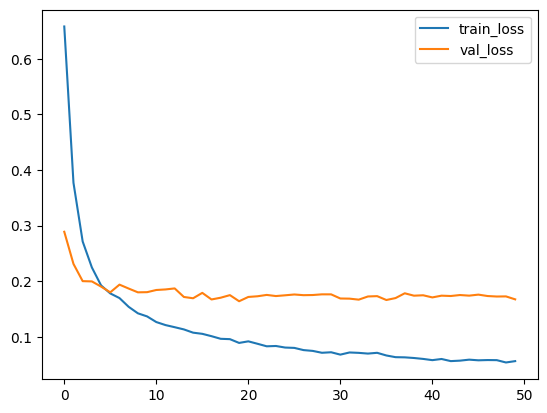

In [153]:
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.legend()
plt.show()

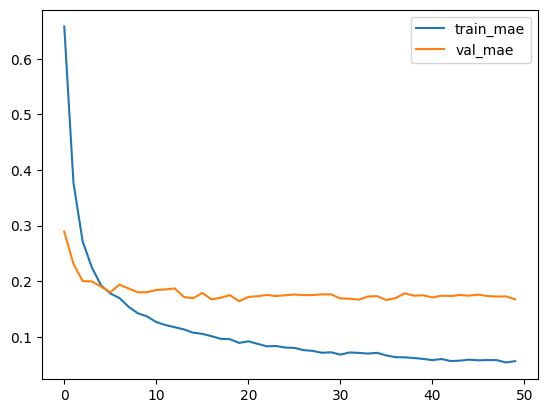

In [154]:
plt.plot(history.history['mae'], label='train_mae')
plt.plot(history.history['val_mae'], label='val_mae')
plt.legend()
plt.show()


In [155]:
test_loss, test_mae = model.evaluate(X_test_scaled, y_test)
print(f"Тестовый MAE: {test_mae:.4f}")

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1755 - mae: 0.1755
Тестовый MAE: 0.1673


Вывод раздела 6: Графики обучения выглядят хорошо: и train_loss, и val_loss уменьшаются и стабилизируются. Аналогично и с mae, что говорит о хорошем поведении модели.

# 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки test_images, выберите случайные 10 запросов из файла test_queries.csv и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [156]:
model.predict(np.zeros((1, X_train_scaled.shape[1])))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


array([[0.00612558]], dtype=float32)

In [157]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 512)                 │       1,446,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,832,261 (18.43 MB)

 Trainable params: 1,610,753 (6.14 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,221,508 (12.29 MB)

In [158]:
embedding_model = tf.keras.models.Model(
    inputs=model.layers[0].input,
    outputs=model.get_layer('dense_2').output
)


In [159]:
image_embeddings = embedding_model.predict(X_test_scaled)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


In [160]:
image_embeddings_dict = {img: emb for img, emb in zip(test_images['image'], image_embeddings)}

In [164]:
merged_df_test.head(5)

,across,action,adult,aerial,age,ahead,air,airborne,alert,ally,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.042428,0.013747,1.059039,1.459749,0.003923,0.215762,0.0,0.176677,0.010782,1.04068


In [175]:
merged_df_test_numeric = merged_df_test.drop(columns=['image'], errors='ignore')

In [176]:
merged_df_test_numeric.head(5)

,0,1,2,3,4,5,6,7,8,9,...,wooden,woodland,word,wrestle,wrinkle,write,yard,yellow,yerba,youth
0,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.23064,1.552335,0.0,0.746736,0.069282,0.965969,0.347483,2.280377,0.369913,0.543061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [180]:
merged_df_test_numeric.columns = merged_df_test_numeric.columns.astype(str)
scaler = StandardScaler()
merged_df_test_scaled = scaler.fit_transform(merged_df_test_numeric)


In [182]:
merged_df_test_scaled = pd.DataFrame(
    scaler.fit_transform(merged_df_test_numeric),
    columns=merged_df_test_numeric.columns
)


In [183]:
random_queries = merged_df_test_scaled.sample(10)

query_embeddings = embedding_model.predict(random_queries)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


In [195]:
merged_df_test_with_text = pd.concat([test_queries[['image','query_id', 'query_text']], pd.DataFrame(merged_df_test_scaled, columns=merged_df_test_numeric.columns)], axis=1)


In [192]:
num_samples = 10

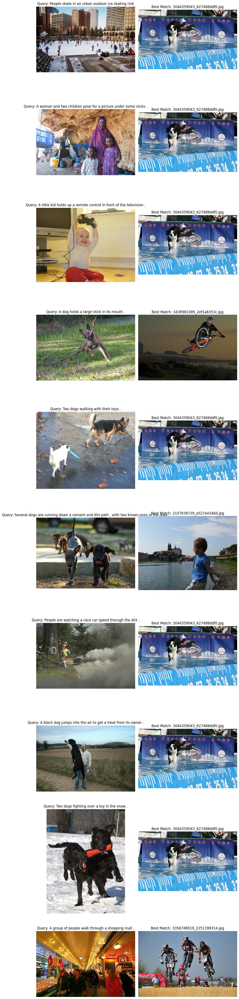

In [196]:
random_queries = merged_df_test_with_text.sample(num_samples)

fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))

for i, (index, row) in enumerate(random_queries.iterrows()):
    query_emb = query_embeddings[i]
    similarities = cosine_similarity([query_emb], list(image_embeddings_dict.values()))
    best_match_idx = np.argmax(similarities)
    best_match_image = list(image_embeddings_dict.keys())[best_match_idx]

    query_text = row['query_text']
    query_image_path = f"/content/test_images/{row['image']}"
    best_match_image_path = f"/content/test_images/{best_match_image}"

    try:
        img_query = Image.open(query_image_path)
        axes[i, 0].imshow(img_query)
        axes[i, 0].set_title(f"Query: {query_text}", fontsize=12)
        axes[i, 0].axis("off")
    except Exception as e:
        axes[i, 0].text(0.5, 0.5, "Image not found", fontsize=12, ha='center')

    try:
        img_match = Image.open(best_match_image_path)
        axes[i, 1].imshow(img_match)
        axes[i, 1].set_title(f"Best Match: {best_match_image}", fontsize=12)
        axes[i, 1].axis("off")
    except Exception as e:
        axes[i, 1].text(0.5, 0.5, "Image not found", fontsize=12, ha='center')

plt.tight_layout()
plt.show()

Ну, очевидно, у нас какие-то проблемы, Хьюстон...

На основе проведенных экспериментов можно сделать вывод, что модель испытывает трудности с корректным сопоставлением текстовых запросов и изображений. Визуализация результатов показывает, что найденные соответствия зачастую не отражают смысл запроса, что свидетельствует о слабой способности модели улавливать семантические взаимосвязи между текстом и изображением. Например, на представленных изображениях модель ошибочно сопоставляет сцены с людьми и природой с изображением собаки, прыгающей в бассейн. Это говорит о том, что либо векторные представления изображений и текстов не удается привести в одно семантическое пространство, либо использованный метод поиска ближайших соседей не способен корректно оценивать их сходство.

Возможные причины ошибок:

Неидеальная векторизация текстов – TF-IDF, который использовался для обработки текстов, учитывает лишь частоту встречаемости слов, но не учитывает их контекстное значение.
Ограниченность эмбеддингов изображений – ResNet50, используемый для генерации векторных представлений изображений, был обучен на ImageNet и может плохо работать с некоторыми категориями картинок.
Косинусное сходство не всегда отражает реальное соответствие – выбранный метод поиска ближайших соседей (cosine similarity) может плохо работать, если текстовые и визуальные представления не хорошо скоррелированы.
Возможная нехватка данных – если модель обучалась на ограниченном наборе данных, её способность к генерализации может быть низкой.
Описание всех шагов работы
Загрузка и предобработка данных

Загрузили файлы с текстовыми запросами и изображениями.
Проверили, что данные корректно загружены, осмотрели их структуру.
Векторизация изображений

Использовали предварительно обученную нейросеть ResNet50 без верхних слоев (include_top=False), используя pooling='avg', чтобы получить эмбеддинги изображений.
Преобразовали изображения в тензоры с размером (224, 224), нормализовали их с помощью preprocess_input и прошли через модель.
Сохранили полученные эмбеддинги изображений в словарь.
Векторизация текстов

Провели очистку текстов (удаление лишних символов, приведение к нижнему регистру, удаление стоп-слов).
Лемматизировали текст с помощью WordNetLemmatizer.
Преобразовали текстовые запросы в векторное представление с помощью TF-IDF.
Сохранили TF-IDF вектора в DataFrame.
Объединение текстовых и визуальных эмбеддингов

В query_id присутствовал идентификатор изображения после #, его удалили, чтобы создать столбец image.
Объединили таблицы tfidf_df_test (тексты) и df_vectors_test (изображения) по image.
Нормализация данных

Убрали нечисловые столбцы, чтобы подготовить данные для модели.
Применили StandardScaler, чтобы привести все признаки к единому масштабу.
Поиск наиболее похожего изображения

Взяли случайные 10 текстовых запросов.
Получили эмбеддинги для текстовых запросов с помощью обученной модели.
Посчитали cosine_similarity между текстовыми эмбеддингами и векторными представлениями изображений.
Определили изображение с максимальным сходством для каждого запроса.
Визуализация результатов

Вывели на экран изображения-запросы и наиболее подходящие картинки по мнению модели.
Подписали соответствия, чтобы наглядно оценить точность модели.



Возможные улучшения модели

Использование контекстных векторных представлений текста – заменить TF-IDF на BERT
Учет дополнительных признаков – можно попробовать обучить модель с учетом метаданных, таких как категории изображений или описание сцены.
Альтернативные методы поиска – вместо cosine_similarity использовать более сложные алгоритмы, например, faiss для поиска ближайших соседей.